In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from  matplotlib.colors import LinearSegmentedColormap
import pandas as pd
import seaborn as sn
import sys
from pathlib import Path
from tqdm import tqdm
import scipy
import os

import torch.nn as nn
from torch import Tensor
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from scipy.stats import wasserstein_distance
from sklearn.metrics import roc_auc_score as roc_auc_score
from scipy.special import kl_div as kl_div
from sklearn.metrics import log_loss as log_loss
from torchmetrics.classification import BinaryCalibrationError

# import custom functions from src folder
module_path = str(Path.cwd() / "../../../src")

if module_path not in sys.path:
    sys.path.append(module_path)

from SequentialNet import SequentialNet
from machine_learning import *
from util import *

In [2]:
def word_to_int(df):
    # Red = 0, blue = 1
    df["class"] = 0
    df_copy = df.copy()
    mask = df_copy["color"] == "blue"
    df.loc[mask, "class"] = 1
    return df


In [3]:
def predict_MCD(model, df, test_dataset, device, n_MC:int = 100):
     # Predict with just model
    df_new = df.copy()
    truth, logits = predict_classifier(model, test_dataset, 2, 100, device)
    preds = torch.argmax(logits, dim=-1).flatten()
    df_new["Prediction"] = preds

    #Get softmax score for blue
    df_new["Confidence"] = torch.softmax(logits, dim=-1)[:,1]

    # Predict with MC dropout
    mean_val, variance_val = mc_predictions(model, test_dataset, 2**8, n_MC, 2, len(test_dataset))
    df_new["Prediction_MC"] = np.argmax(mean_val, axis=-1).flatten()
    df_new["Confidence_MC"] = mean_val[:,-1]
    # Error is the same for both scores
    df_new["Std_MC"] = np.sqrt(variance_val[:,0])
    return df_new

In [4]:
# Set up device
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
print(f"Using {device} device")

Using cuda device


In [23]:
# Machine learning options
x1_key = "x1"
x2_key = "x2"
n_data = [250, 500, 1000, 2000, 3000, 5000, 10000]
bs_list = [128, 128, 128*2, 128*2, 1024, 1024, 1024*2]
#n_data = [10000]
max_err_val = [0]*len(n_data)
for i in range(len(n_data)):
    if n_data[i] < 1000:
        max_err_val[i] = 0.5
    else:
        max_err_val[i] = 0.25
patience = 30
load_values = False
save_values = True

#Data constants
shapes = [2, 6]
scales = [5, 3]
k = len(scales) # Number of classes
d = 2 # Number of dimensions
p_c = [1/len(shapes)]*len(shapes) # Uniform distributon over classes
grid_rmax=40

tag = f'k_{k}_d{d}_shapes{shapes}_scales{scales}_pc{p_c}'.replace(" ", "")

# Read files
train_n = 50000
trainfile = f"train_n_{train_n}_{tag}"
valfile = f"val_n_5000_{tag}"
testfile = f"test_n_10000_{tag}"
gridfile = f"grid_x1_x2_10000_{tag}"

train_data = pd.read_csv(f"../data/{trainfile}.csv")
val_data = pd.read_csv(f"../data/{valfile}.csv")
test_data = pd.read_csv(f"../data/{testfile}.csv")
grid_data = pd.read_csv(f"../data/{gridfile}.csv")

X_train = torch.Tensor(np.dstack((train_data[x1_key], train_data[x2_key]))).to(torch.float32)[0]
Y_train = label_maker(train_data["class"], 2)

X_val = torch.Tensor(np.dstack((val_data[x1_key], val_data[x2_key]))).to(torch.float32)[0]
Y_val = label_maker(val_data["class"], 2)

X_test = torch.Tensor(np.dstack((test_data[x1_key], test_data[x2_key]))).to(torch.float32)[0]
Y_test = label_maker(test_data["class"], 2)

X_grid = torch.Tensor(np.dstack((grid_data[x1_key], grid_data[x2_key]))).to(torch.float32)[0]
Y_grid = torch.zeros(X_grid.shape)

In [6]:
# Create datasets for pytorch
val_dataset = torch.utils.data.TensorDataset(X_val, Y_val)
test_dataset = torch.utils.data.TensorDataset(X_test, Y_test)
grid_dataset = torch.utils.data.TensorDataset(X_grid, Y_grid)

### Increasing number of datapoints

In [7]:
drop_out_rate = 0.3
n_MC=200
epochs=250
patience = 30
lr = 0.01
n_data = [250, 500, 1000, 2000, 3000, 5000, 10000]
bs_list = [250, 500, 1000, 2000, 3000, 5000, 10000]
max_err_val = [0]*len(n_data)
for i in range(len(n_data)):
    if n_data[i] < 1000:
        max_err_val[i] = 0.5
    else:
        max_err_val[i] = 0.25

test_dfs = [0]*len(n_data)
grid_dfs = [0]*len(n_data)

val_df = pd.read_csv(f"../data/{valfile}.csv")
test_df = pd.read_csv(f"../data/{testfile}.csv")
grid_df = pd.read_csv(f"../data/{gridfile}.csv")

if load_values==False:
    for i in range(len(n_data)):
        #logloss_min = 1
        n_train = n_data[i]
        batchsize = bs_list[i]
        #for j in tqdm(range(20)):
        # Create datasets for pytorch
        train_dataset = torch.utils.data.TensorDataset(X_train[0:n_train], Y_train[0:n_train])

        # Create model
        model = SequentialNet(L=200, n_hidden=5, activation="relu", in_channels=2, out_channels=2, p=drop_out_rate).to(device)
        optimizer = optim.Adam(model.parameters(), lr=lr)

        # Train model
        training_results = train_classifier(model, train_dataset, 
                                val_dataset, batchsize=batchsize, epochs = epochs, 
                                device = device, optimizer = optimizer, early_stopping=patience)
        # Predict on val set
        val_df = predict_MCD(model, val_df, val_dataset, device, n_MC=20)
        ll = log_loss(val_df["class"], val_df["Confidence_MC"])
        preds = torch.Tensor(val_df["Confidence_MC"])
        target = torch.Tensor(val_df["class"])
        bce_l1 = BinaryCalibrationError(n_bins=15, norm='l1')
        ece = bce_l1(preds, target).item()
        print(f"n_train = {n_data[i]}, logloss={ll}, ECE= {ece}")

        #if ll < logloss_min:
            #print(f"New best values: n_train = {n_data[i]}, logloss={ll}, ECE= {ece}")
            #logloss_min = ll
            # Predict
        test_dfs[i] = predict_MCD(model, test_df, test_dataset, device, n_MC=n_MC)
        grid_dfs[i] = predict_MCD(model, grid_df, grid_dataset, device, n_MC=n_MC)

        # Save prediction
        if save_values:
            if (not os.path.isdir(f"predictions/{trainfile}") ):
                os.mkdir(f"predictions/{trainfile}")
            test_dfs[i].to_csv(f"predictions/{trainfile}/{testfile}_SequentialNet_small_MCD_pd{drop_out_rate}_nMC_{n_MC}_Vndata-{n_data[i]}.csv")
            grid_dfs[i].to_csv(f"predictions/{trainfile}/grid_{tag}_SequentialNet_small_MCD_pd{drop_out_rate}_nMC_{n_MC}_Vndata-{n_data[i]}.csv")
else:
    for i in range(len(n_data)):
    #val_data_ensembles = [pd.read_csv(f"predictions/{trainfile}/{valfile}_SequentialNet_{n_ensemble}ensembles_ndata-{n_data[i]}.csv") for i in range(len(n_data))]
        test_dfs[i] = pd.read_csv(f"predictions/{trainfile}/{testfile}_SequentialNet_small_MCD_pd{drop_out_rate}_nMC_{n_MC}_Vndata-{n_data[i]}.csv")
        grid_dfs[i] = pd.read_csv(f"predictions/{trainfile}/grid_{tag}_SequentialNet_small_MCD_pd{drop_out_rate}_nMC_{n_MC}_Vndata-{n_data[i]}.csv")


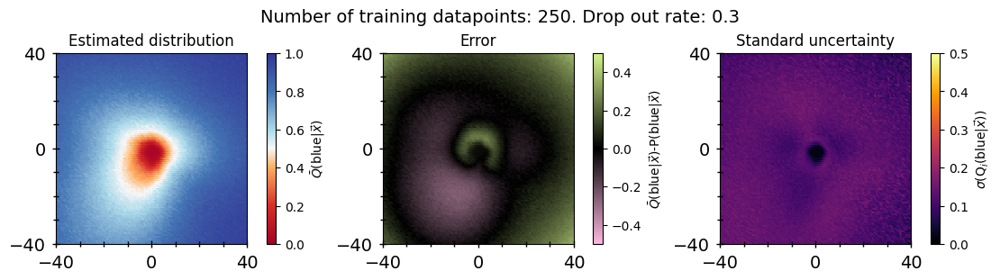

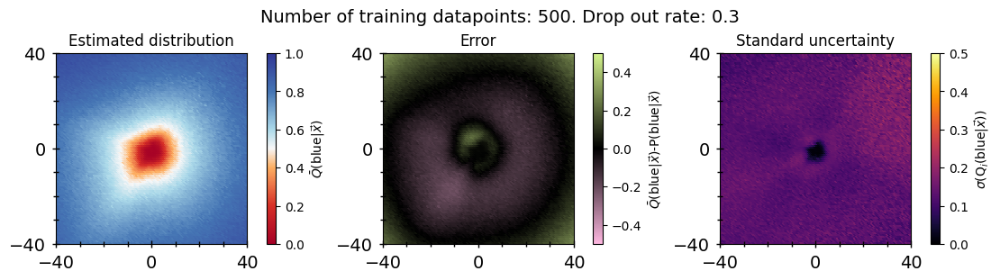

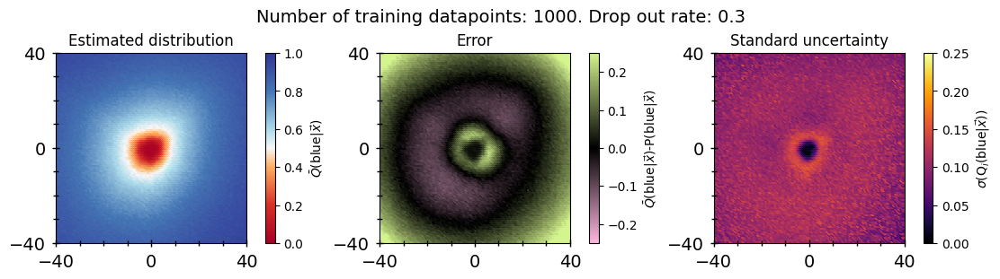

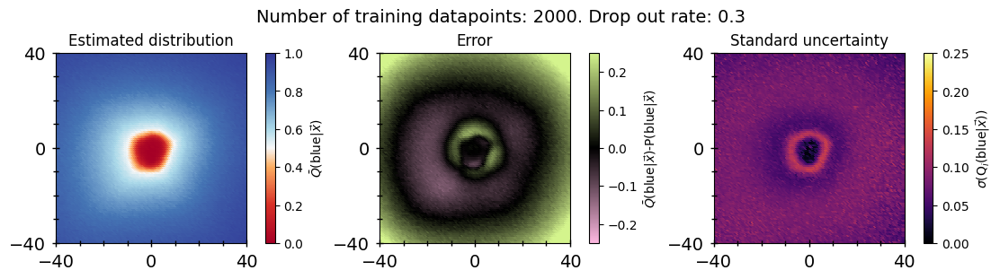

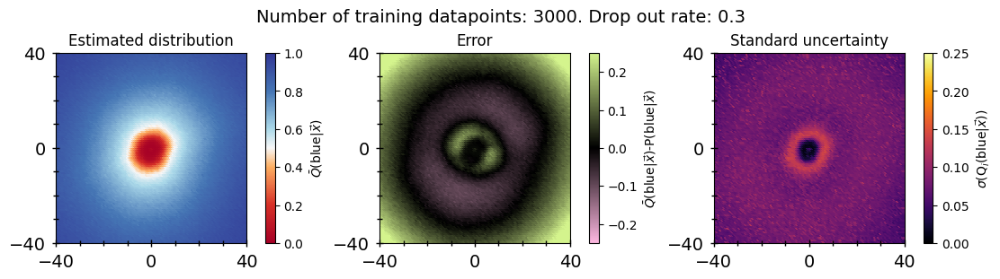

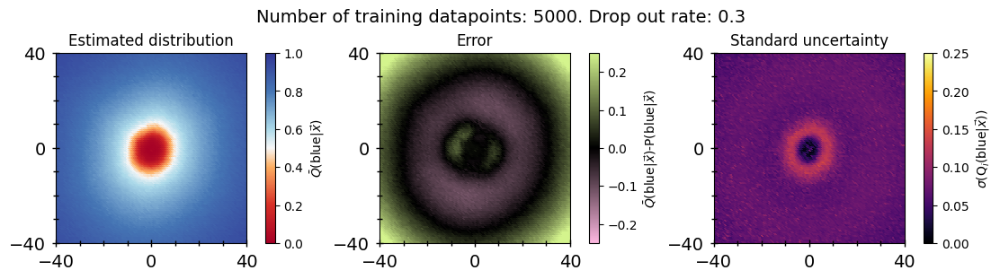

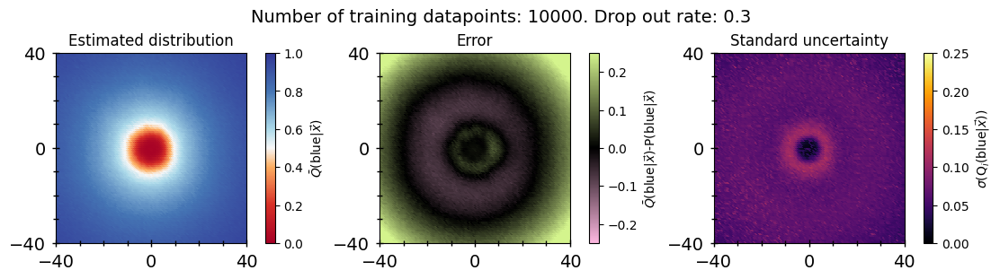

In [8]:
for i in range(len(n_data)):
    fig, axs = plt.subplots(nrows = 1, ncols = 3, figsize = (11,3), layout="constrained")
    axs[0] = plot_results(grid_dfs[i], "Confidence_MC", axs[0], "Estimated distribution", grid=True, rmax=grid_rmax)
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=red_blue_cmap()), fraction=0.050, pad=0.04, 
                 label=r"$\bar{Q}$(blue|$\vec{x}$)", ax=axs[0])

    axs[1] = plot_diff(grid_dfs[i], grid_dfs[i], "Confidence_MC", "p_c1_given_r", axs[1], r"Error", max_val = max_err_val[i], rmax=grid_rmax)
    hue_norm = mpl.colors.Normalize(vmin=-max_err_val[i], vmax=max_err_val[i], clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=pink_black_green_cmap()), fraction=0.050, pad=0.04, 
                 label=r"$\bar{Q}$(blue|$\vec{x}$)-P(blue|$\vec{x}$)", ax=axs[1])

    axs[2] = plot_std(grid_dfs[i], "Std_MC", axs[2], "Standard uncertainty", grid=True, max_val = max_err_val[i], rmax=grid_rmax)
    
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=max_err_val[i], clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap="inferno"), fraction=0.050, pad=0.04, 
                 label=r"$\sigma$(Q$_i$(blue|$\vec{x}$))", ax=axs[2])

    #fig.savefig(f"../fig/MCD_ntrain_{n_data[i]}.pdf", format="pdf", bbox_inches='tight', dpi=350)
    fig.suptitle(f"Number of training datapoints: {n_data[i]}. Drop out rate: {drop_out_rate}", fontsize=14)

In [12]:
scores = calculate_metrics(test_dfs, grid_dfs, n_data, grid_dfs[0], test_dfs[0], 
                           "Prediction_MC", "Confidence_MC", "Std_MC")
print(scores)

test_dfs_small = [df[0:1000] for df in test_dfs]
scores_small = calculate_metrics(test_dfs_small, grid_dfs, n_data, grid_dfs[0], test_dfs[0][0:1000], 
                           "Prediction_MC", "Confidence_MC", "Std_MC")
print(scores - scores_small)

   N data       ACC    ROCAUC   WD test   WD grid    Avg UE    Std UE  \
0     250  0.722172  0.787412  0.066855  0.061997  0.115917  0.031249   
1     500  0.730173  0.800176  0.074354  0.045504  0.120408  0.033615   
2    1000  0.736674  0.805917  0.060454  0.050557  0.107140  0.028603   
3    2000  0.736674  0.805185  0.042775  0.053384  0.071212  0.025639   
4    3000  0.740774  0.808446  0.045358  0.051556  0.082844  0.027295   
5    5000  0.744074  0.809308  0.039059  0.038749  0.078262  0.026529   
6   10000  0.744474  0.809321  0.034748  0.051896  0.071179  0.021705   

   Mean KL-div test  Mean KL-div grid   LogLoss       ECE       MCE     RMSCE  
0          0.017266          0.010063  0.549466  0.051389  0.568825  0.062165  
1          0.011357          0.006934  0.541731  0.072266  0.317974  0.083693  
2          0.010537          0.006479  0.534948  0.061430  0.936509  0.074074  
3          0.005016          0.006297  0.527079  0.043924  0.948192  0.058254  
4          0.00

### Results for MC dropout during training only

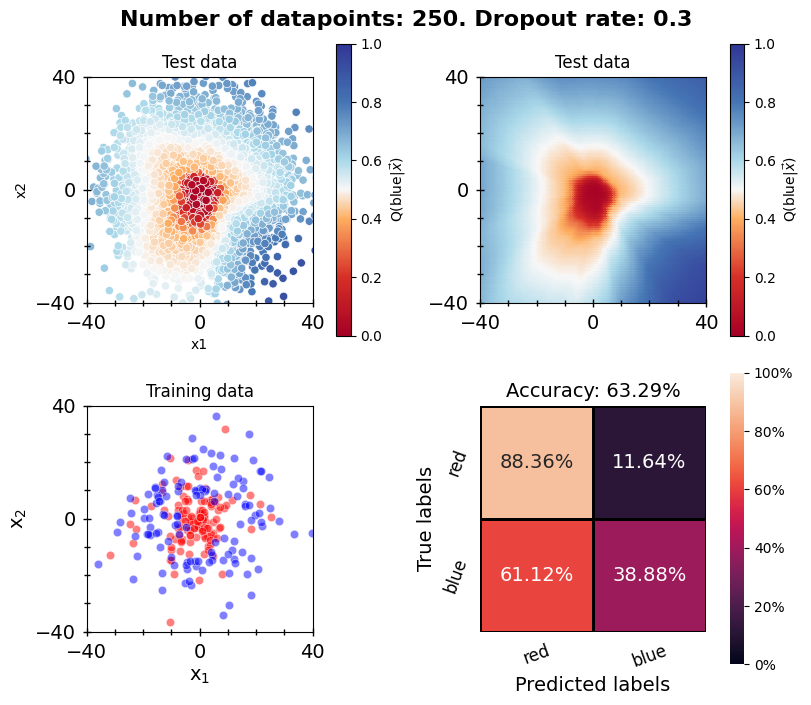

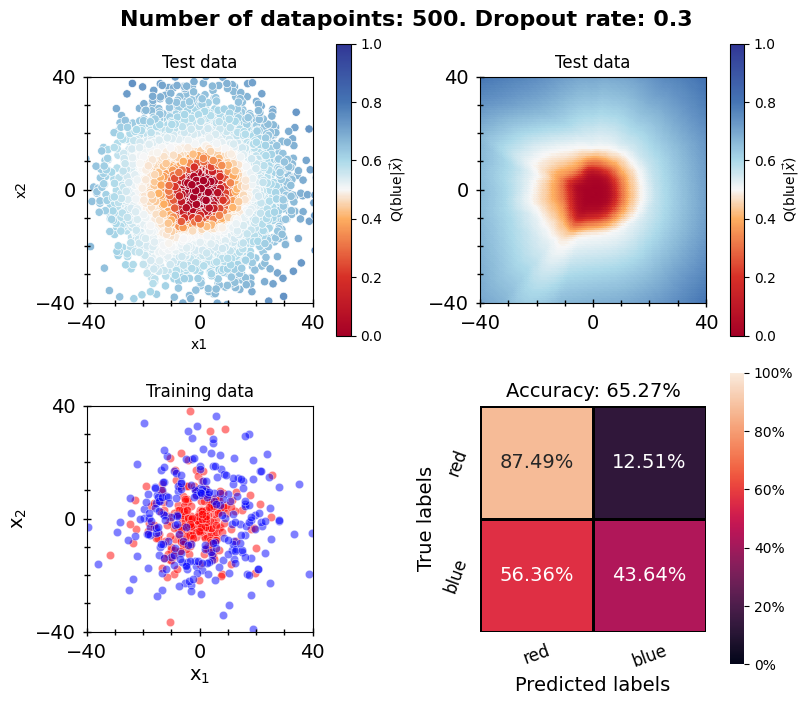

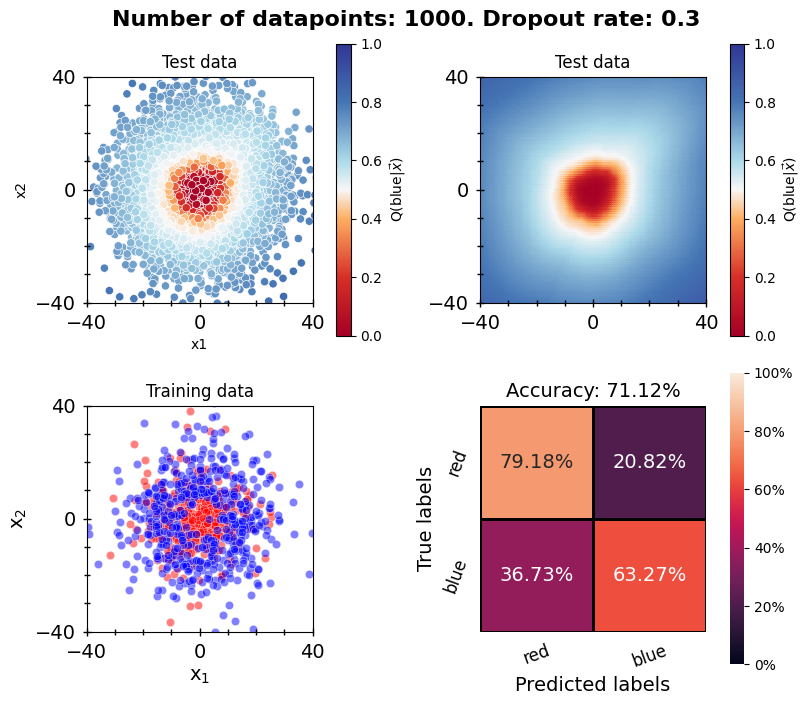

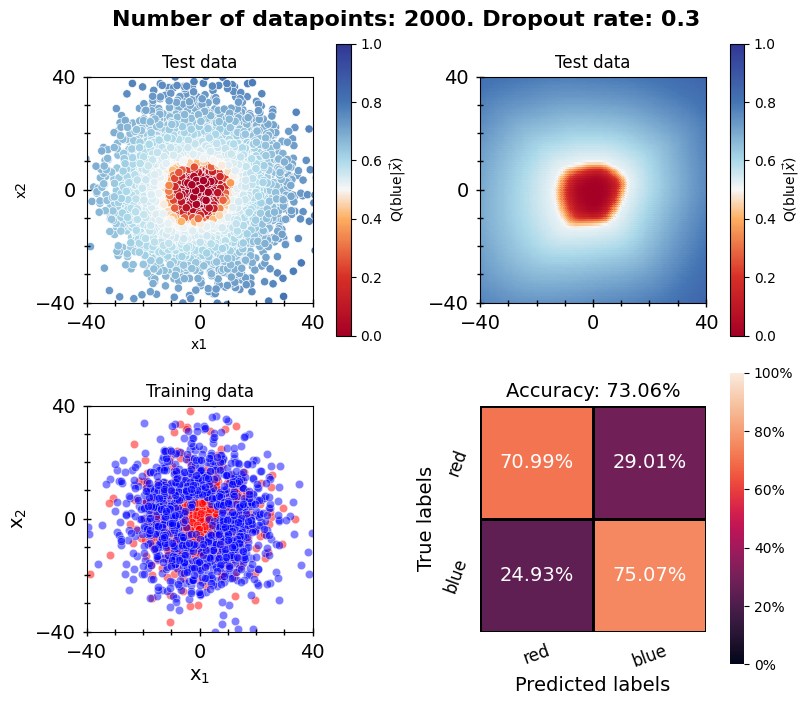

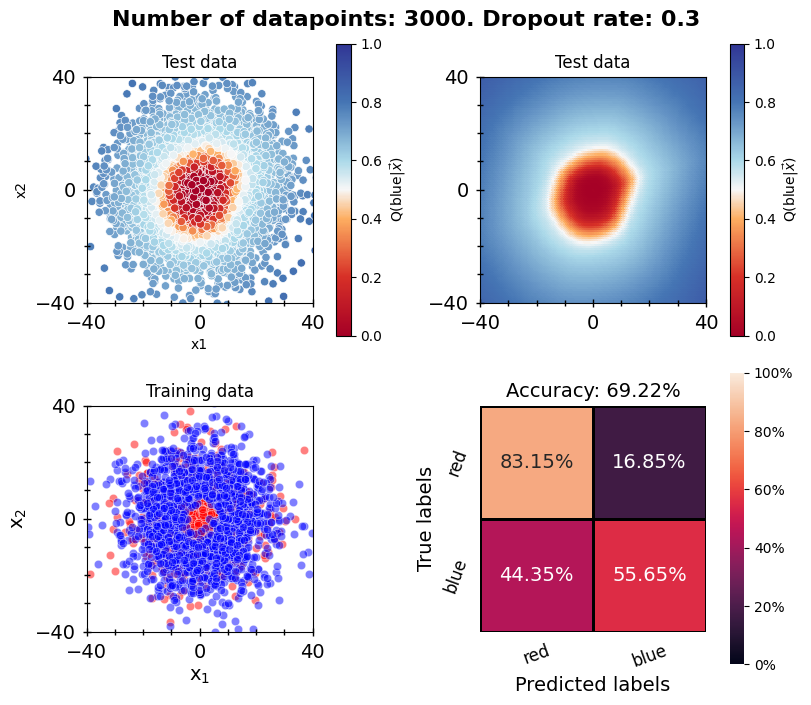

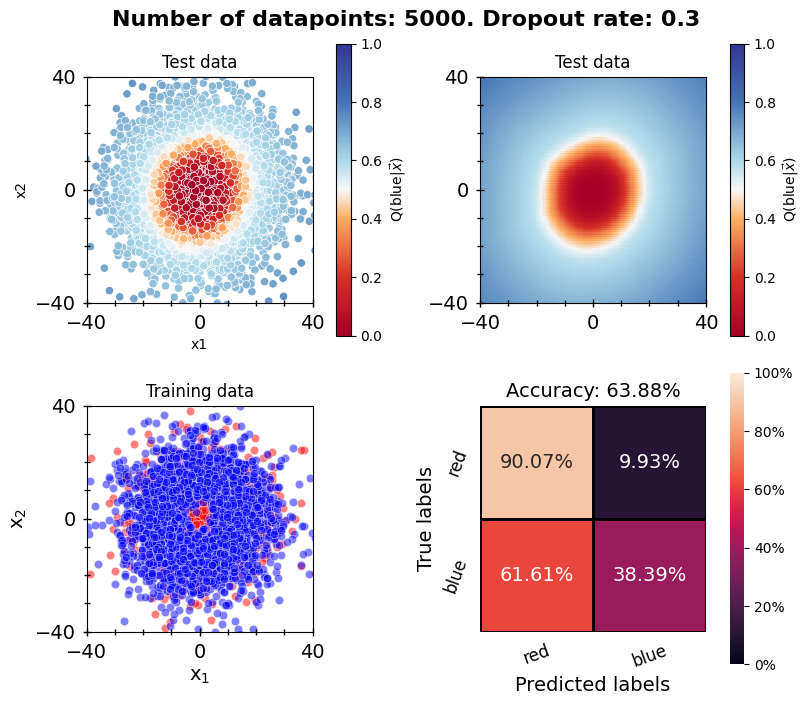

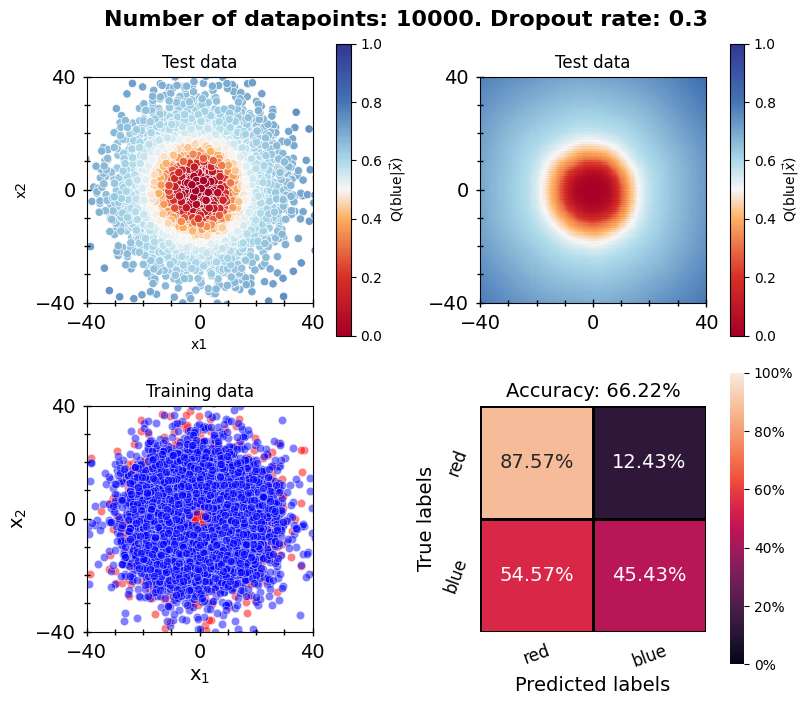

In [19]:

for i in range(len(n_data)):
    fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 7), layout="constrained")

    axs[0][0] = plot_results(test_dfs[i], "Confidence", axs[0][0], "Test data", rmax=grid_rmax)
    axs[0][1] = plot_results(grid_dfs[i], "Confidence", axs[0][1], "Test data", grid=True, rmax=grid_rmax)
    axs[1][1] = plot_conf_matrix(test_dfs[i], "class", "Prediction", ["red", "blue"], axs[1][1])
    axs[1][0] = plot_data(train_data[0:n_data[i]], axs[1][0], "Training data", rmax=grid_rmax)

    cmap = red_blue_cmap()
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][0])
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][1])

    fig.suptitle(f"Number of datapoints: {n_data[i]}. Dropout rate: {drop_out_rate}", size=16, fontweight="bold")

### Plot MC dropout during training and inference results

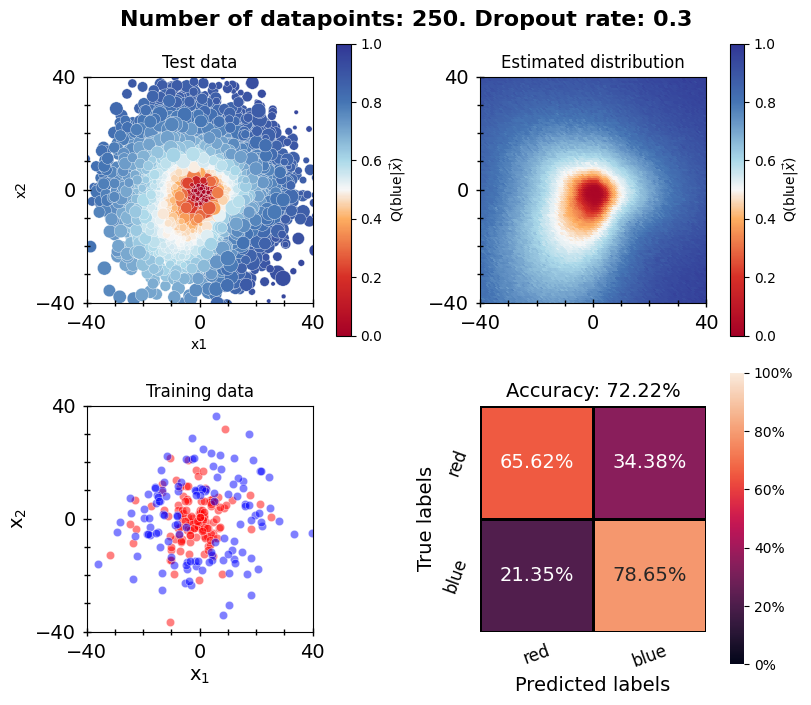

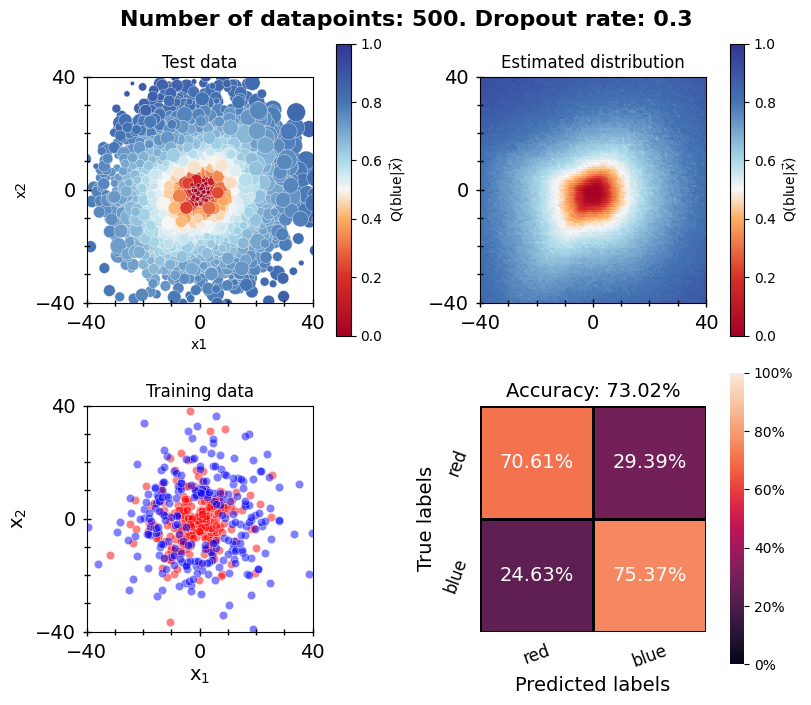

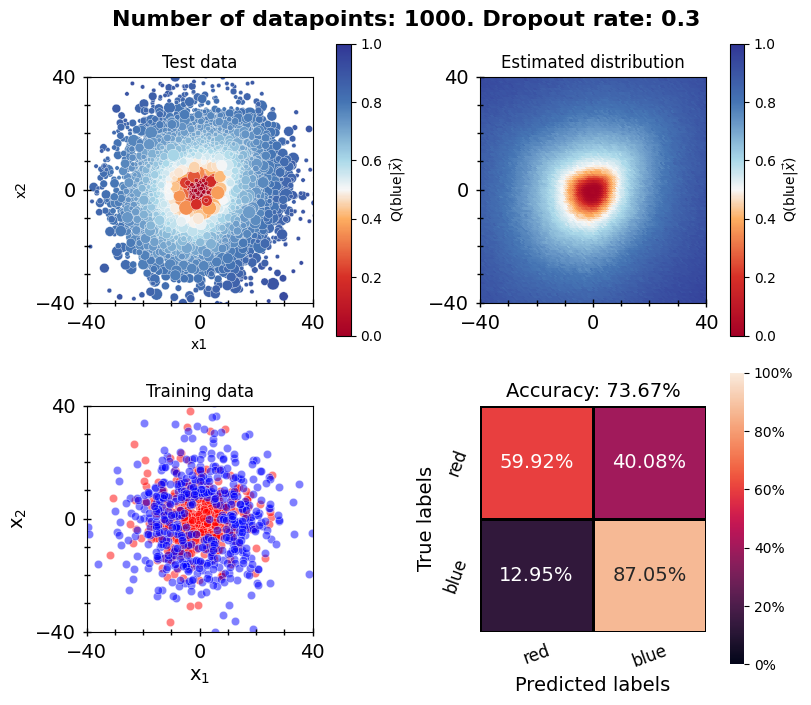

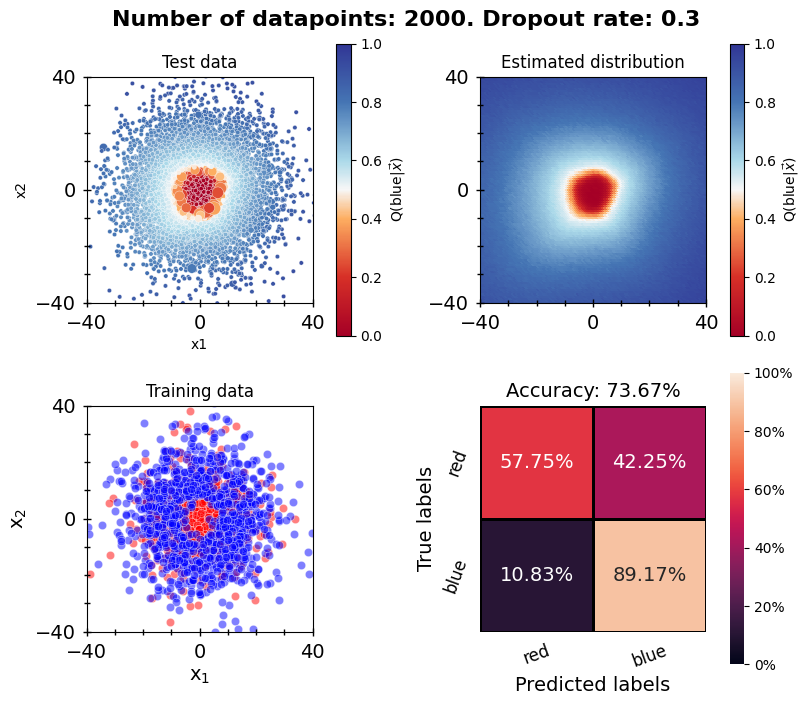

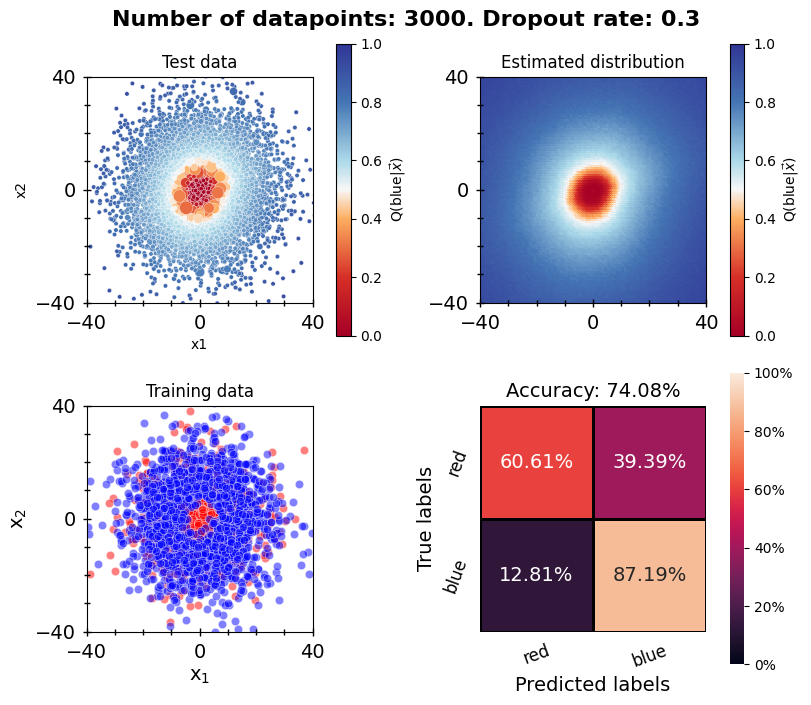

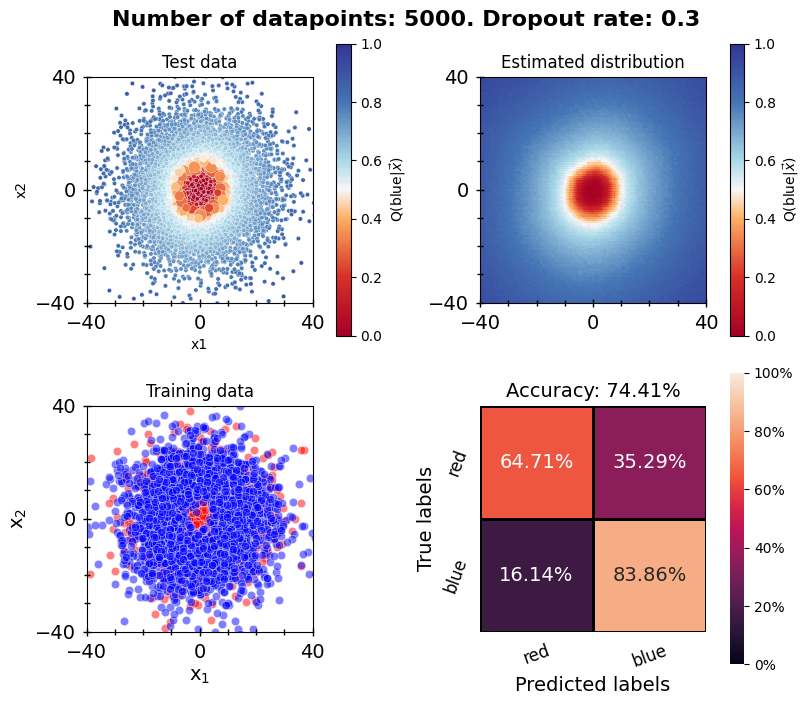

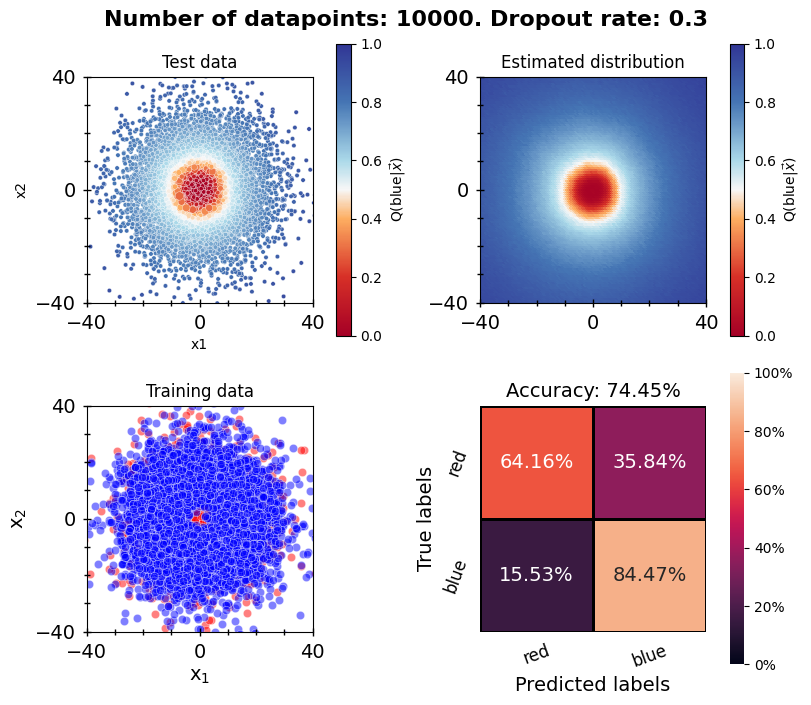

In [18]:
# Plot
for i in range(len(n_data)):
    fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 7), layout="constrained")

    axs[0][0] = plot_results(test_dfs[i], "Confidence_MC", axs[0][0], "Test data", error_key="Std_MC", rmax=grid_rmax)
    axs[0][1] = plot_results(grid_dfs[i], "Confidence_MC", axs[0][1], "Estimated distribution", grid=True, rmax=grid_rmax)
    axs[1][1] = plot_conf_matrix(test_dfs[i], "class", "Prediction_MC", ["red", "blue"], axs[1][1])
    axs[1][0] = plot_data(train_data[0:n_data[i]], axs[1][0], "Training data", rmax=grid_rmax)

    cmap = red_blue_cmap()
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][0])
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][1])

    fig.suptitle(f"Number of datapoints: {n_data[i]}. Dropout rate: {drop_out_rate}", size=16, fontweight="bold")


In [ ]:
test_data

,color,x1,x2,a1,a2,r1,r2,r_x,a_x,class
0,red,4.637181,11.350187,0.935784,1.553757,11.837233,3,12.260921,1.182936,0
1,red,10.042744,10.382106,0.682262,0.612850,11.887063,3,14.444543,0.802012,0
2,blue,-5.605532,11.920284,1.943990,0.295500,10.273541,3,13.172515,2.010363,1
3,blue,-1.477669,-14.679668,4.577589,0.170343,11.788505,3,14.753853,4.612066,1
4,blue,-9.945727,8.379890,2.213879,1.781017,13.296149,3,13.005386,2.441433,1
...,...,...,...,...,...,...,...,...,...,...
9995,red,0.596807,9.253463,1.318706,2.526894,11.560692,3,9.272689,1.506390,0
9996,blue,-6.404741,6.863661,1.997287,1.496279,8.674995,3,9.387787,2.321621,1
9997,blue,-11.277142,2.093363,2.757517,0.865739,9.295702,3,11.469791,2.958053,1
9998,red,8.927445,11.836816,0.898653,3.012991,17.796208,3,14.825974,0.924606,0


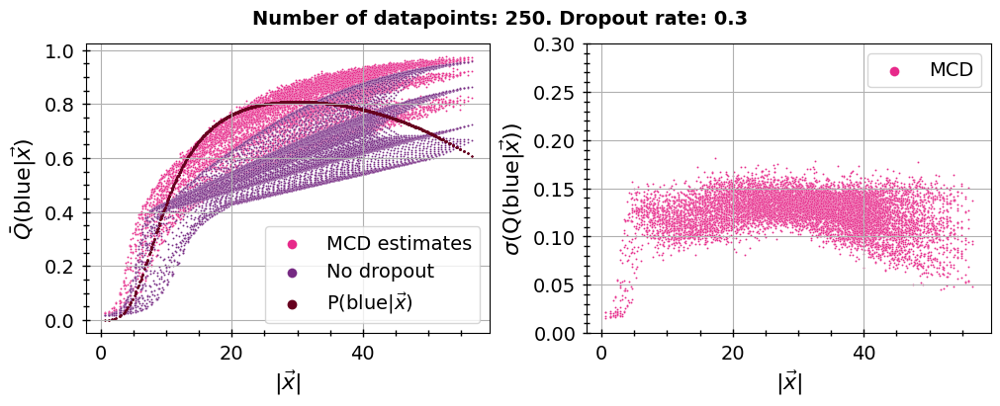

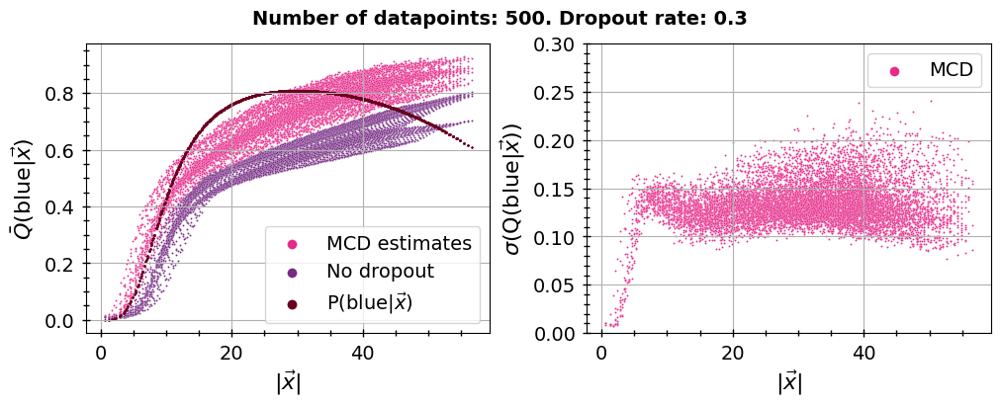

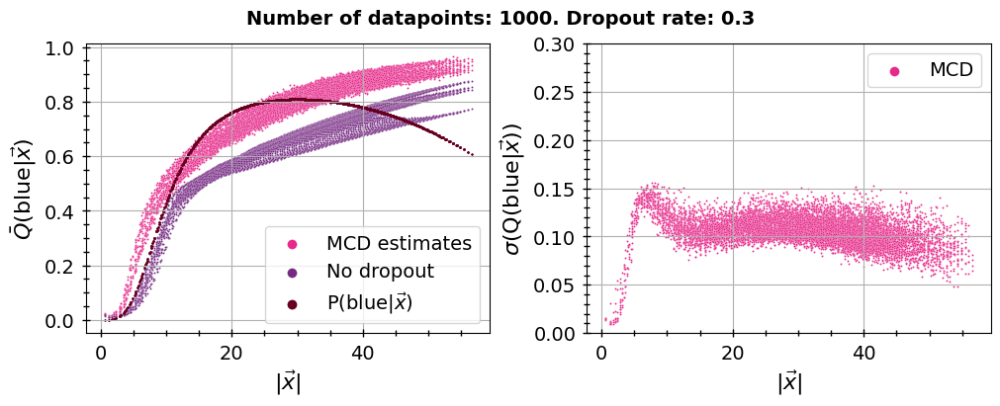

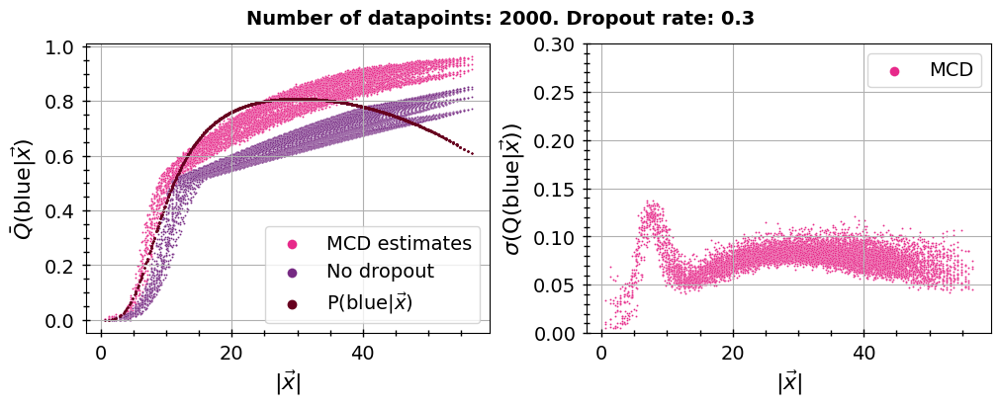

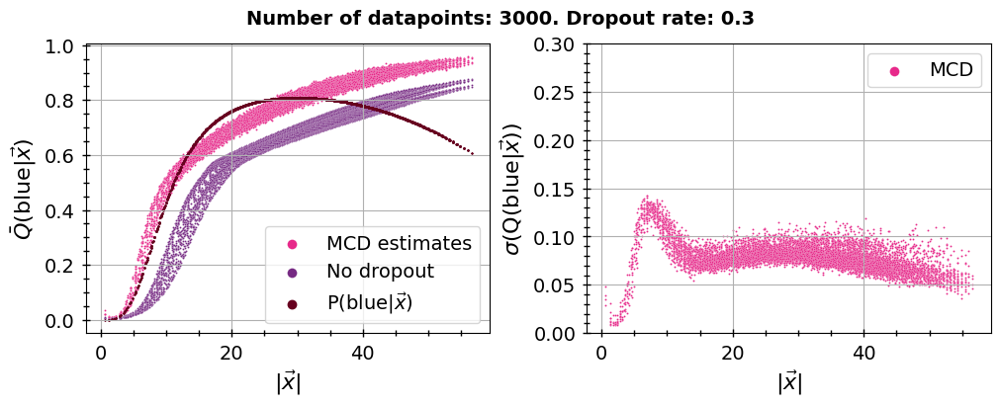

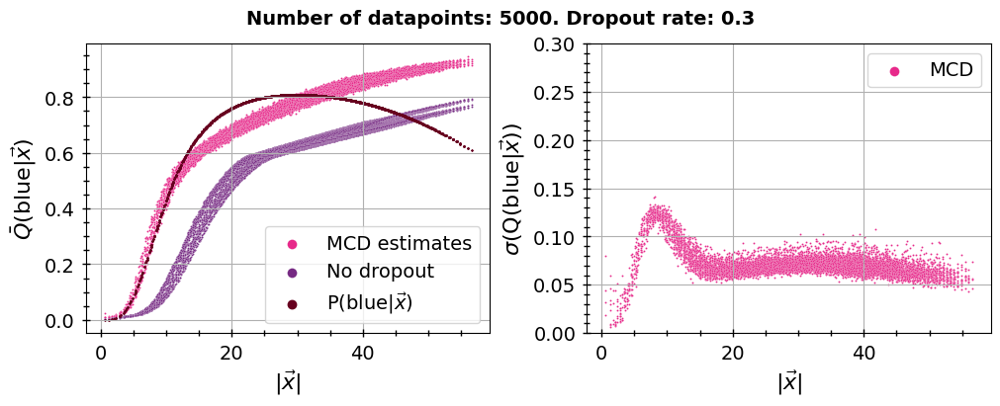

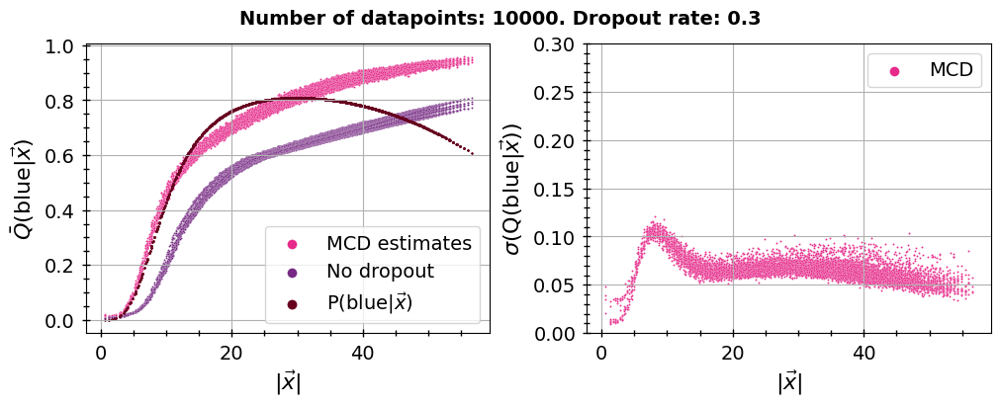

In [17]:
for i in range(len(n_data)):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
    sn.scatterplot(grid_dfs[i], x="r", y="Confidence_MC", s=2, ax = axs[0], label="MCD estimates", color="#e7298a")
    sn.scatterplot(grid_dfs[i], x="r", y="Confidence", s=2, ax = axs[0], label="No dropout", color="#762a83")
    sn.scatterplot(grid_dfs[0], x="r", y="p_c1_given_r", s=2, ax = axs[0], label=r"P(blue|$\vec{x}$)", color="#67001f", linewidth=0)
    axs[0].set_ylabel(r"$\bar{Q}$(blue|$\vec{x}$)", fontsize=16)

    sn.scatterplot(grid_dfs[i], x="r", y="Std_MC", s=2, ax = axs[1], label="MCD", color="#e7298a")
    axs[1].set_ylabel(r"$\sigma$(Q(blue|$\vec{x}$))", fontsize=16)
    axs[1].set_ylim(0, 0.3)

    for ax in axs:
        ax.legend(markerscale=5, fontsize=14)
        ax.set_xlabel(r"$|\vec{x}|$", fontsize=16)
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
        ax.minorticks_on()
        ax.grid()
    fig.suptitle(f"Number of datapoints: {n_data[i]}. Dropout rate: {drop_out_rate}", size=14, fontweight="bold")

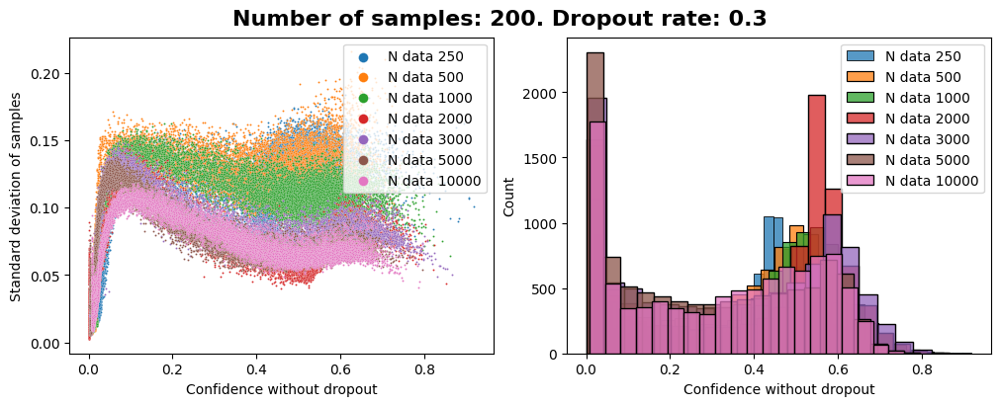

In [20]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(n_data)):
    sn.scatterplot(test_dfs[i], x="Confidence", y=f"Std_MC", s=2, label=f"N data {n_data[i]}", ax = axs[0])
    axs[0].legend(markerscale=5)
    axs[0].set_ylabel("Standard deviation of samples")
    axs[0].set_xlabel("Confidence without dropout")

    sn.histplot(test_dfs[i], x="Confidence", label=f"N data {n_data[i]}", ax = axs[1])
    axs[1].legend(markerscale=5)
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel("Confidence without dropout")
    fig.suptitle(f"Number of samples: {200}. Dropout rate: {drop_out_rate}", size=16, fontweight="bold")

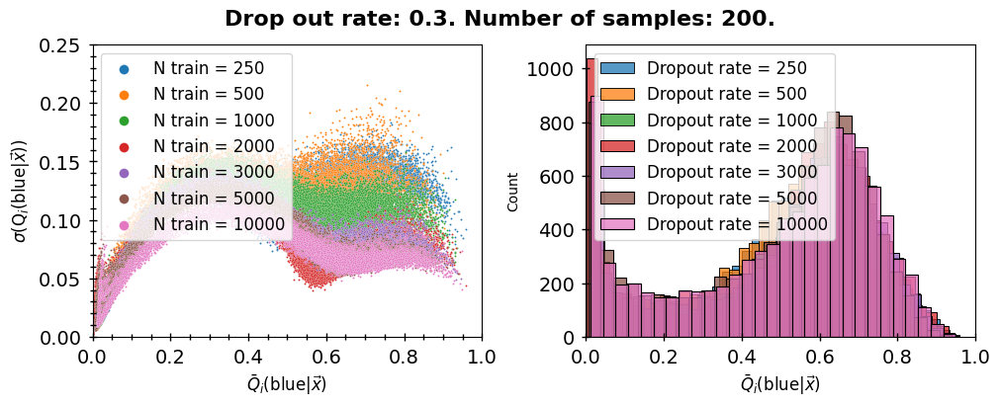

In [21]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(n_data)):
    sn.scatterplot(test_dfs[i], x="Confidence_MC", y="Std_MC", s=2, label=f"N train = {n_data[i]}", ax = axs[0])
    axs[0].legend(markerscale=5, fontsize=12)
    axs[0].set_ylabel(r"$\sigma$(Q$_i$(blue|$\vec{x}$))", fontsize=12)
    axs[0].set_xlabel(r"$\bar{Q}_i$(blue|$\vec{x}$)", fontsize=12)
    axs[0].set_xlim(0, 1)
    axs[0].set_ylim(0, 0.25)
    sn.histplot(test_dfs[i], x="Confidence_MC", label=f"Dropout rate = {n_data[i]}", ax = axs[1])
    axs[1].legend(markerscale=5, fontsize=12)
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel(r"$\bar{Q}_i$(blue|$\vec{x}$)", fontsize=12)
    axs[1].set_xlim(0, 1)
    for ax in axs:
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
    axs[0].minorticks_on()
    fig.suptitle(f"Drop out rate: {drop_out_rate}. Number of samples: {n_MC}.", size=16, fontweight="bold")

### Try different drop out rates

In [24]:

#p_drop_out = [0.1, 0.2, 0.3, 0.4, 0.5]
p_drop_out = [0.1, 0.2, 0.3, 0.4, 0.5]
n_train = 5000
n_MC=200
test_dfs_DO = [0]*len(p_drop_out)
grid_dfs_DO = [0]*len(p_drop_out)

if load_values==False:
    for i in range(len(p_drop_out)):
        grid_dfs_DO[i] = pd.read_csv(f"../data/{gridfile}.csv")
        test_dfs_DO[i] = pd.read_csv(f"../data/{testfile}.csv")
        # Create datasets for pytorch
        train_dataset = torch.utils.data.TensorDataset(X_train[0:n_train], Y_train[0:n_train])

        # Create model
        model = SequentialNet(L=1024*2, n_hidden=5, activation="relu", in_channels=2, out_channels=2, p=p_drop_out[i]).to(device)
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        # Train model
        training_results = train_classifier(model, train_dataset, 
                                val_dataset, batchsize=2**10, epochs = 250, 
                                device = device, optimizer = optimizer, early_stopping=patience)

        # Predict
        test_dfs_DO[i] = predict_MCD(model, test_dfs_DO[i], test_dataset, device, n_MC=n_MC)
        grid_dfs_DO[i] = predict_MCD(model, grid_dfs_DO[i], grid_dataset, device, n_MC=n_MC)

        # Save prediction
        if (not os.path.isdir(f"predictions/{trainfile}") ):
            os.mkdir(f"predictions/{trainfile}")
        test_dfs_DO[i].to_csv(f"predictions/{trainfile}/{testfile}_SequentialNet_MCD_Vpd{p_drop_out[i]}_nMC_{n_MC}_ndata-{n_train}.csv")
        grid_dfs_DO[i].to_csv(f"predictions/{trainfile}/grid_{tag}_SequentialNet_MCD_Vpd{p_drop_out[i]}_nMC_{n_MC}_ndata-{n_train}.csv")
else:
    for i in range(len(p_drop_out)):
    #val_data_ensembles = [pd.read_csv(f"predictions/{trainfile}/{valfile}_SequentialNet_{n_ensemble}ensembles_ndata-{n_data[i]}.csv") for i in range(len(n_data))]
        test_dfs_DO[i] = pd.read_csv(f"predictions/{trainfile}/{testfile}_SequentialNet_MCD_Vpd{p_drop_out[i]}_nMC_{n_MC}_ndata-{n_train}.csv")
        grid_dfs_DO[i] = pd.read_csv(f"predictions/{trainfile}/grid_{tag}_SequentialNet_MCD_Vpd{p_drop_out[i]}_nMC_{n_MC}_ndata-{n_train}.csv")

    

 28%|██▊       | 71/250 [00:52<02:12,  1.35it/s]


Stopping training early at epoch 71


100%|██████████| 100/100 [00:00<00:00, 459.04it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 460.93it/s]


Starting MC dropout inference: 


 32%|███▏      | 79/250 [00:57<02:04,  1.37it/s]


Stopping training early at epoch 79


100%|██████████| 100/100 [00:00<00:00, 465.38it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 464.85it/s]


Starting MC dropout inference: 


 32%|███▏      | 81/250 [00:58<02:02,  1.38it/s]


Stopping training early at epoch 81


100%|██████████| 100/100 [00:00<00:00, 466.81it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 465.58it/s]


Starting MC dropout inference: 


 48%|████▊     | 121/250 [01:27<01:33,  1.38it/s]


Stopping training early at epoch 121


100%|██████████| 100/100 [00:00<00:00, 465.93it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 465.31it/s]


Starting MC dropout inference: 


 60%|█████▉    | 149/250 [01:48<01:13,  1.38it/s]


Stopping training early at epoch 149


100%|██████████| 100/100 [00:00<00:00, 465.44it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 465.19it/s]


Starting MC dropout inference: 


100%|██████████| 200/200 [00:34<00:00,  5.83it/s]


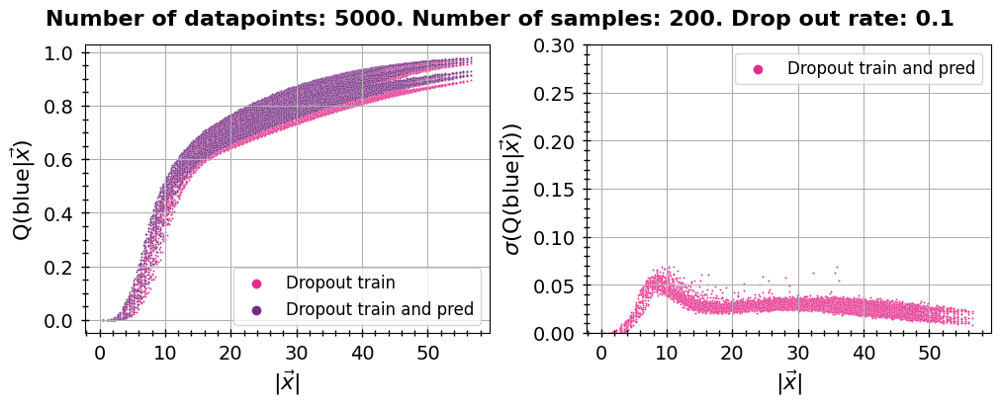

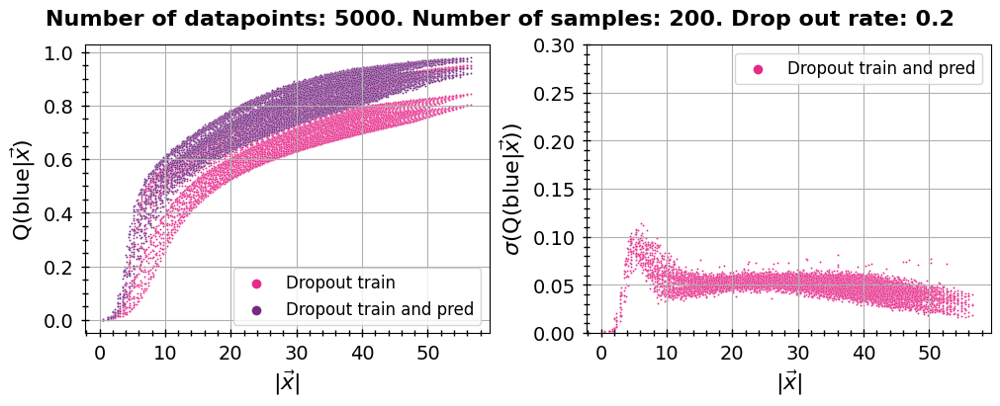

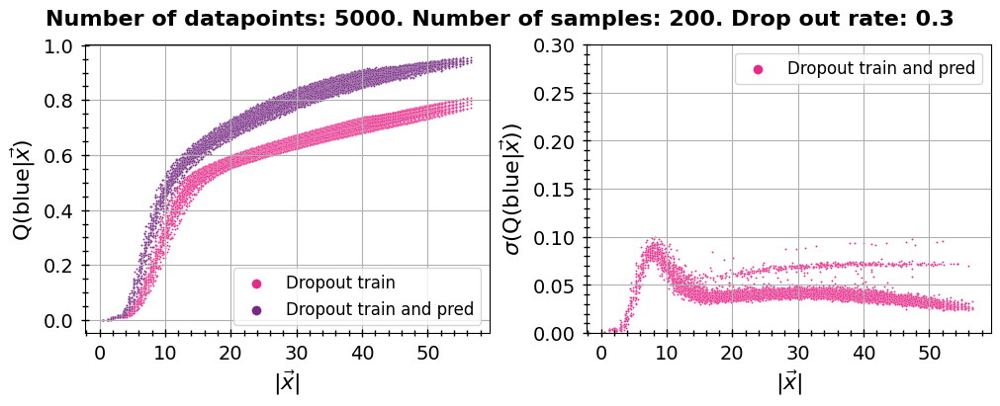

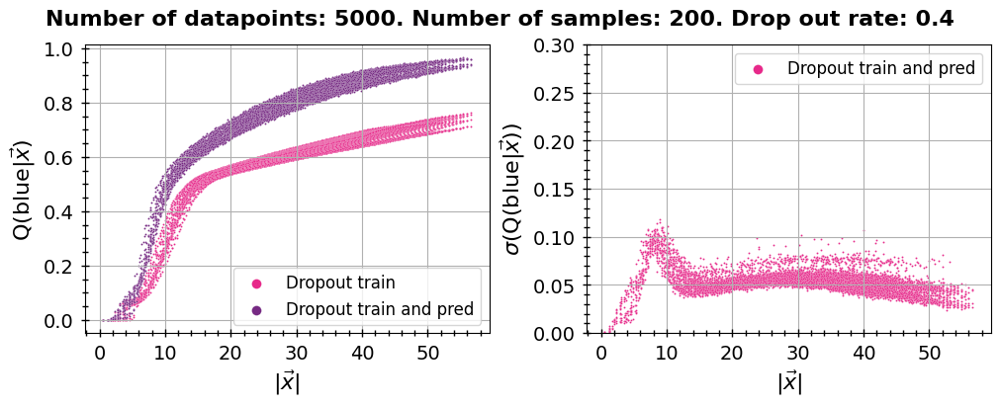

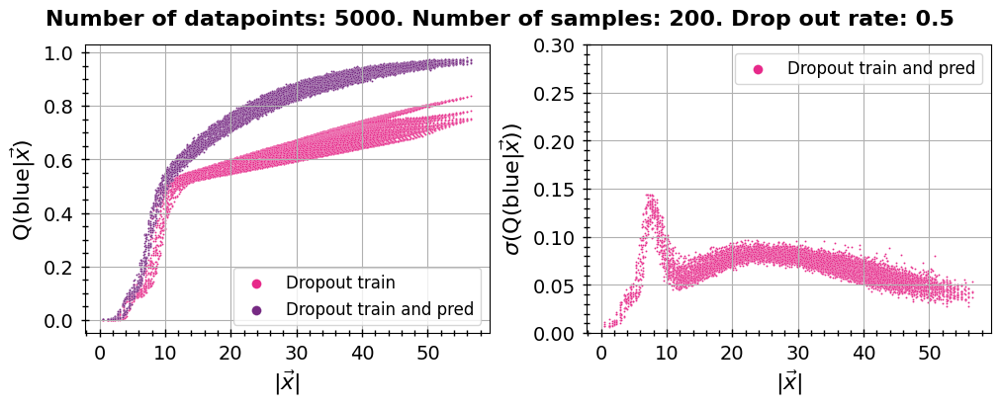

In [26]:
for i in range(len(p_drop_out)):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
    sn.scatterplot(grid_dfs_DO[i], x="r", y="Confidence", s=2, ax = axs[0], label="Dropout train", color="#e7298a")
    sn.scatterplot(grid_dfs_DO[i], x="r", y="Confidence_MC", s=2, ax = axs[0], label="Dropout train and pred", color="#762a83")
    #sn.lineplot(truth_data, x="r_x", y="P_blue_given_x", linewidth=2, ax = axs[0], label="Generating function", color="#67001f")
    axs[0].set_ylabel(r"Q(blue|$\vec{x}$)", fontsize=16)

    sn.scatterplot(grid_dfs_DO[i], x="r", y="Std_MC", s=2, ax = axs[1], label="Dropout train and pred", color="#e7298a")
    axs[1].set_ylabel(r"$\sigma$(Q(blue|$\vec{x}$))", fontsize=16)
    axs[1].set_ylim(0, 0.3)

    for ax in axs:
        ax.legend(markerscale=5, fontsize=12)
        ax.set_xlabel(r"$|\vec{x}|$", fontsize=16)
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
        ax.minorticks_on()
        ax.grid()
    fig.suptitle(f"Number of datapoints: {n_train}. Number of samples: {n_MC}. Drop out rate: {p_drop_out[i]}", size=16, fontweight="bold")

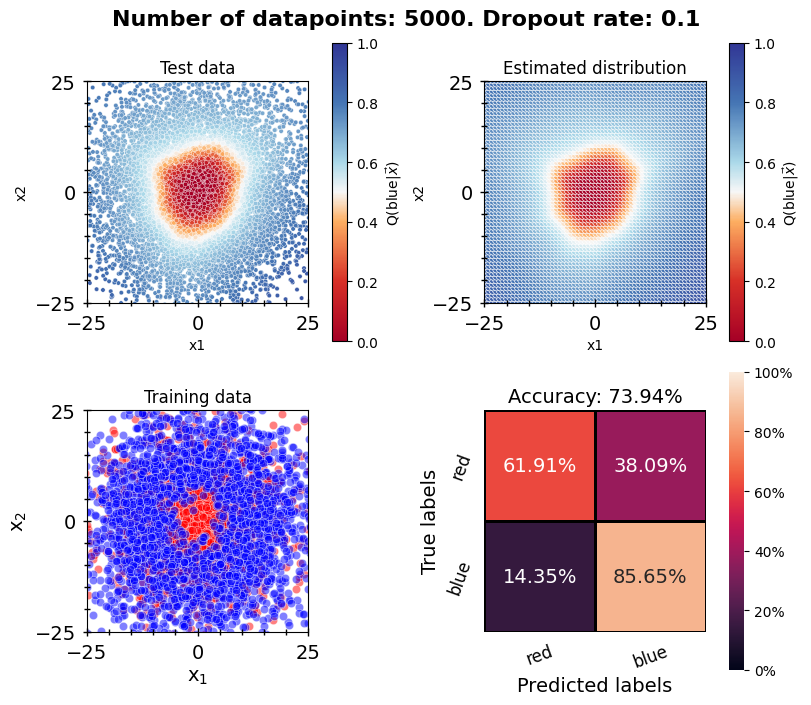

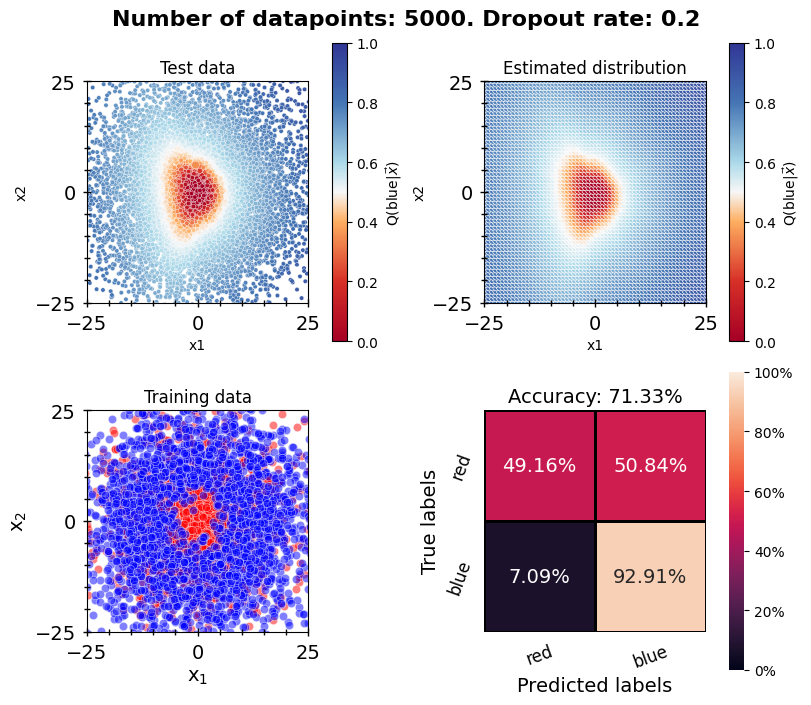

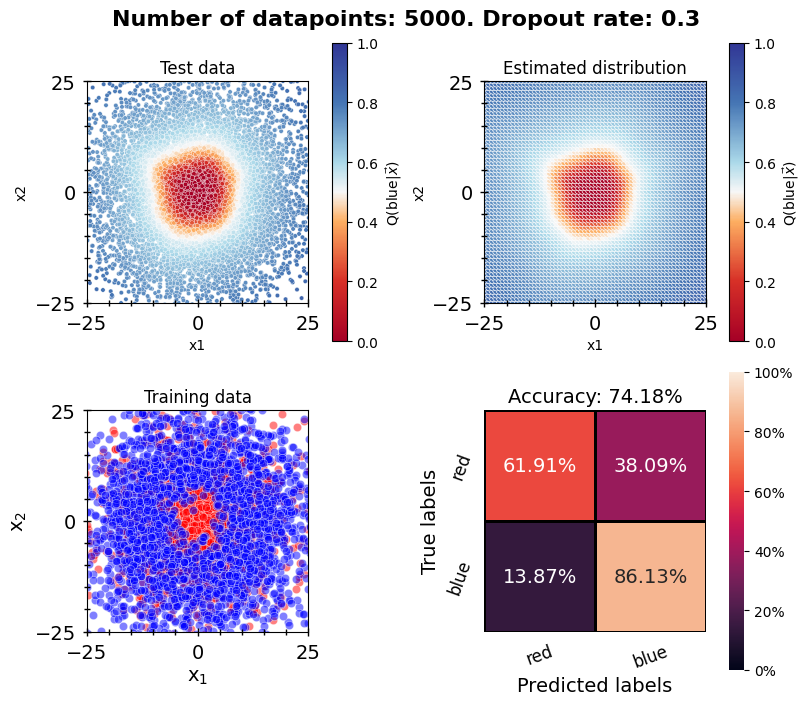

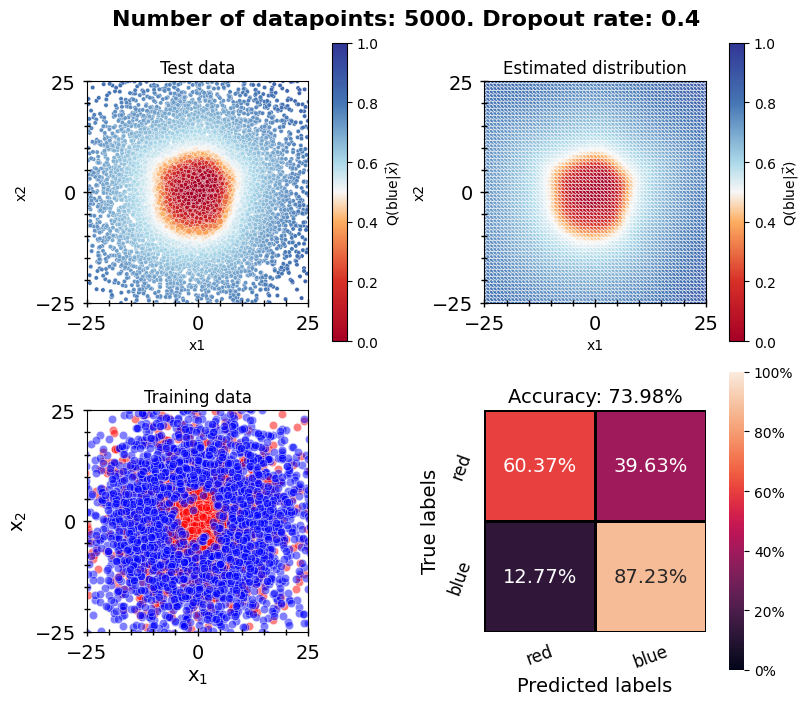

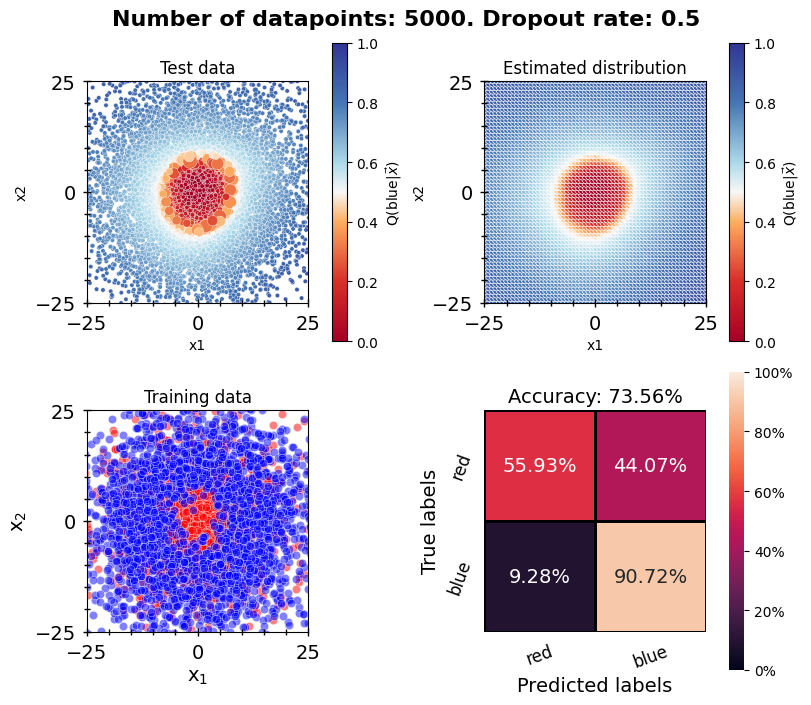

In [ ]:
# Plot
for i in range(len(p_drop_out)):
    fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 7), layout="constrained")

    axs[0][0] = plot_results(test_dfs_DO[i], "Confidence_MC", axs[0][0], "Test data", error_key="Std_MC")
    axs[0][1] = plot_results(grid_dfs_DO[i], "Confidence_MC", axs[0][1], "Estimated distribution", grid=True)
    axs[1][1] = plot_conf_matrix(test_dfs_DO[i], "class", "Prediction_MC", ["red", "blue"], axs[1][1])
    axs[1][0] = plot_data(train_data[0:n_train], axs[1][0], "Training data")

    cmap = red_blue_cmap()
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][0])
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][1])

    fig.suptitle(f"Number of datapoints: {n_train}. Dropout rate: {p_drop_out[i]}", size=16, fontweight="bold")


### Standard deviation of MC dropout prediction

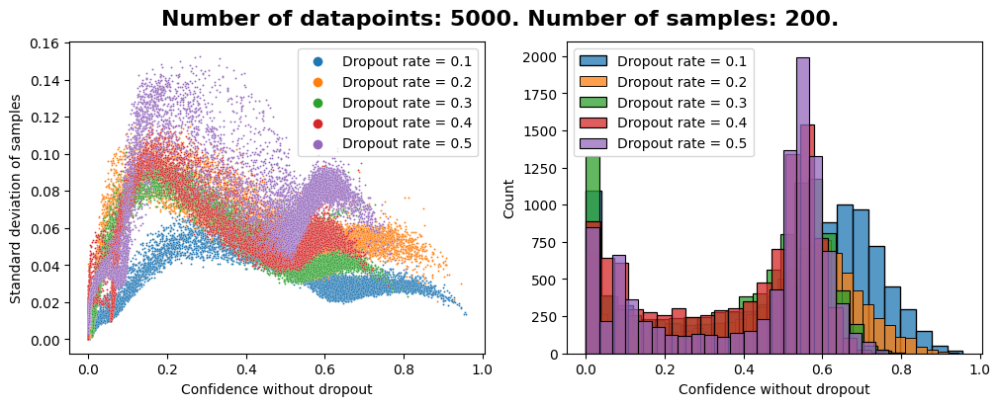

In [29]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(p_drop_out)):
    sn.scatterplot(test_dfs_DO[i], x="Confidence", y="Std_MC", s=2, label=f"Dropout rate = {p_drop_out[i]}", ax = axs[0])
    axs[0].legend(markerscale=5)
    axs[0].set_ylabel("Standard deviation of samples")
    axs[0].set_xlabel("Confidence without dropout")
    sn.histplot(test_dfs_DO[i], x="Confidence", label=f"Dropout rate = {p_drop_out[i]}", ax = axs[1])
    axs[1].legend(markerscale=5)
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel("Confidence without dropout")
    fig.suptitle(f"Number of datapoints: {n_train}. Number of samples: {n_MC}.", size=16, fontweight="bold")

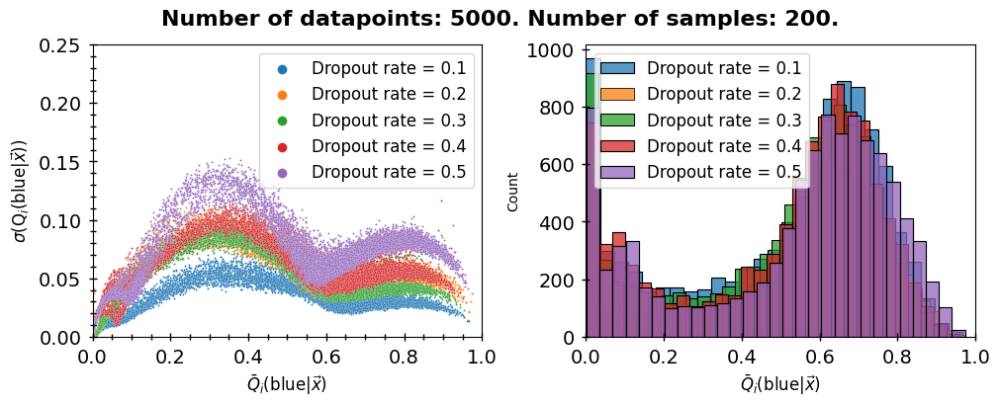

In [30]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(p_drop_out)):
    sn.scatterplot(test_dfs_DO[i], x="Confidence_MC", y="Std_MC", s=2, label=f"Dropout rate = {p_drop_out[i]}", ax = axs[0])
    axs[0].legend(markerscale=5, fontsize=12)
    axs[0].set_ylabel(r"$\sigma$(Q$_i$(blue|$\vec{x}$))", fontsize=12)
    axs[0].set_xlabel(r"$\bar{Q}_i$(blue|$\vec{x}$)", fontsize=12)
    axs[0].set_xlim(0, 1)
    axs[0].set_ylim(0, 0.25)
    sn.histplot(test_dfs_DO[i], x="Confidence_MC", label=f"Dropout rate = {p_drop_out[i]}", ax = axs[1])
    axs[1].legend(markerscale=5, fontsize=12)
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel(r"$\bar{Q}_i$(blue|$\vec{x}$)", fontsize=12)
    axs[1].set_xlim(0, 1)
    for ax in axs:
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
    axs[0].minorticks_on()
    fig.suptitle(f"Number of datapoints: {n_train}. Number of samples: {n_MC}.", size=16, fontweight="bold")

In [31]:
n_MC_list = [10, 100, 1000]
n_train = 1000
drop_out_rate = 0.3
test_dfs_nMC = [0]*len(n_MC_list)
grid_dfs_nMC = [0]*len(n_MC_list)

if load_values==False:
    for i in range(len(p_drop_out)):
        grid_dfs_nMC[i] = pd.read_csv(f"../data/{gridfile}.csv")
        test_dfs_nMC[i] = pd.read_csv(f"../data/{testfile}.csv")
        # Create datasets for pytorch
        train_dataset = torch.utils.data.TensorDataset(X_train[0:n_train], Y_train[0:n_train])

        # Create model
        model = SequentialNet(L=1024*2, n_hidden=5, activation="relu", in_channels=2, out_channels=2, p=drop_out_rate).to(device)
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        # Train model
        training_results = train_classifier(model, train_dataset, 
                                val_dataset, batchsize=2**10, epochs = 250, 
                                device = device, optimizer = optimizer, early_stopping=patience)

        # Predict
        test_dfs_nMC[i] = predict_MCD(model, test_dfs_nMC[i], test_dataset, device, n_MC=n_MC_list[i])
        grid_dfs_nMC[i] = predict_MCD(model, grid_dfs_nMC[i], grid_dataset, device, n_MC=n_MC_list[i])

        # Save prediction
        if (not os.path.isdir(f"predictions/{trainfile}") ):
            os.mkdir(f"predictions/{trainfile}")
        test_dfs_nMC[i].to_csv(f"predictions/{trainfile}/{testfile}_SequentialNet_MCD_pd{drop_out_rate}_VnMC_{n_MC_list[i]}_ndata-{n_train}.csv")
        grid_dfs_nMC[i].to_csv(f"predictions/{trainfile}/grid_{tag}_SequentialNet_MCD_pd{drop_out_rate}_VnMC_{n_MC_list[i]}_ndata-{n_train}.csv")
else:
    for i in range(len(n_MC_list)):
    #val_data_ensembles = [pd.read_csv(f"predictions/{trainfile}/{valfile}_SequentialNet_{n_ensemble}ensembles_ndata-{n_data[i]}.csv") for i in range(len(n_data))]
        test_dfs_nMC[i] = pd.read_csv(f"predictions/{trainfile}/{testfile}_SequentialNet_MCD_pd{drop_out_rate}_VnMC_{n_MC_list[i]}_ndata-{n_train}.csv")
        grid_dfs_nMC[i] = pd.read_csv(f"predictions/{trainfile}/grid_{tag}_SequentialNet_MCD_pd{drop_out_rate}_VnMC_{n_MC_list[i]}_ndata-{n_train}.csv")

    

  0%|          | 1/250 [00:00<01:04,  3.85it/s]

 48%|████▊     | 119/250 [00:31<00:34,  3.81it/s]


Stopping training early at epoch 119


100%|██████████| 100/100 [00:00<00:00, 444.57it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 441.68it/s]


Starting MC dropout inference: 


 60%|█████▉    | 149/250 [00:38<00:26,  3.85it/s]


Stopping training early at epoch 149


100%|██████████| 100/100 [00:00<00:00, 439.10it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 438.22it/s]


Starting MC dropout inference: 


 56%|█████▌    | 139/250 [00:36<00:28,  3.86it/s]


Stopping training early at epoch 139


100%|██████████| 100/100 [00:00<00:00, 442.53it/s]


Starting MC dropout inference: 


100%|██████████| 100/100 [00:00<00:00, 436.65it/s]


Starting MC dropout inference: 


 72%|███████▏  | 179/250 [00:47<00:18,  3.74it/s]

Stopping training early at epoch 179


IndexError: list index out of range

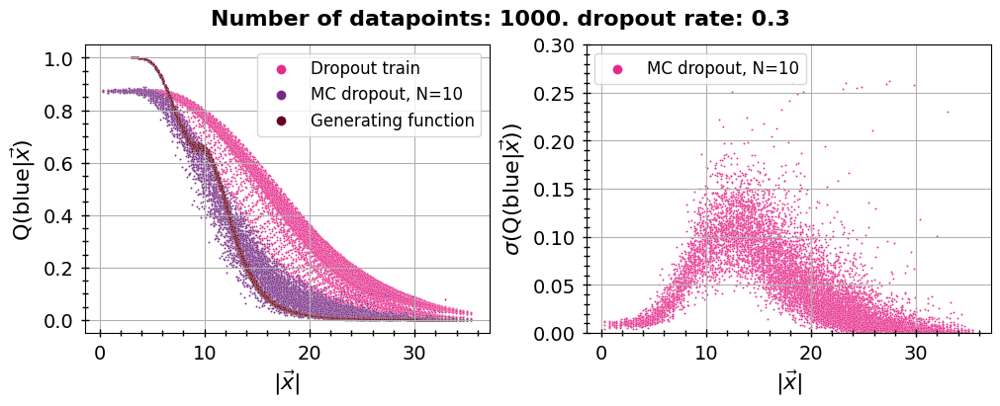

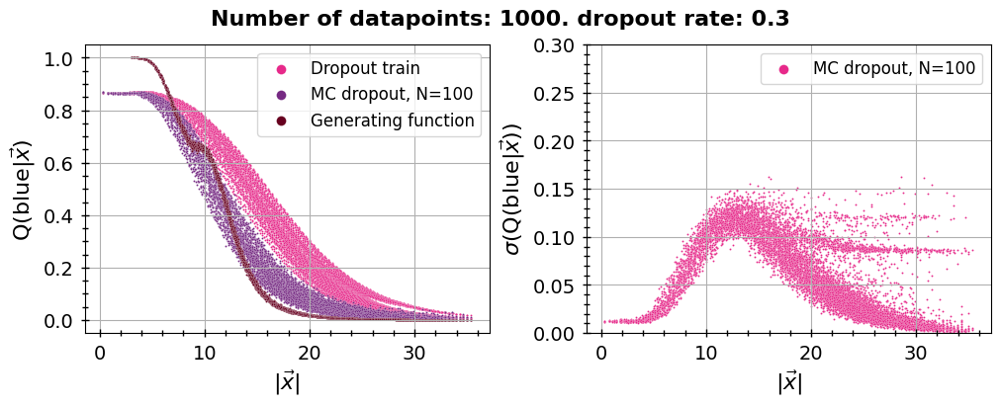

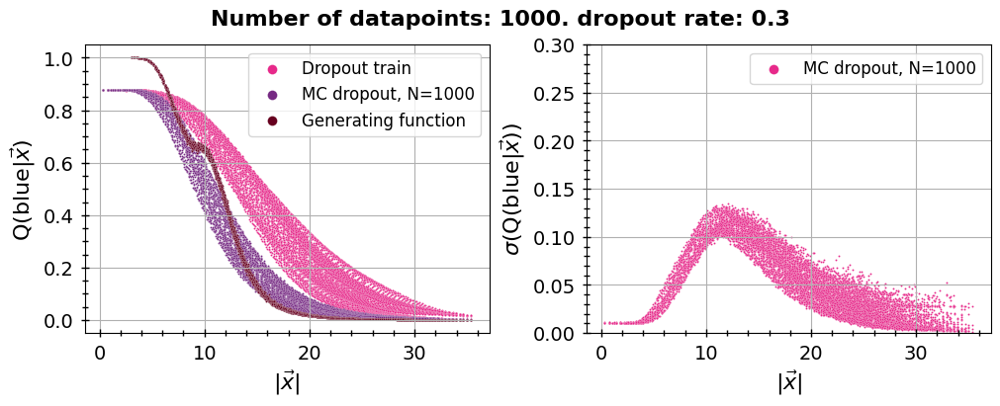

In [ ]:

for i in range(len(n_MC_list)):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
    sn.scatterplot(grid_dfs_nMC[i], x="r_x", y=f"Confidence", s=2, ax = axs[0], label="Dropout train", color="#e7298a")
    sn.scatterplot(grid_dfs_nMC[i], x="r_x", y=f"Confidence_MC", s=2, ax = axs[0], label=f"MC dropout, N={n_MC_list[i]}", color="#762a83")
    sn.scatterplot(truth_data, x="r_x", y="P_blue_given_x", s=2, ax = axs[0], label="Generating function", color="#67001f")
    axs[0].set_ylabel(r"Q(blue|$\vec{x}$)", fontsize=16)

    sn.scatterplot(grid_dfs_nMC[i], x="r_x", y=f"Std_MC", s=2, ax = axs[1], label=f"MC dropout, N={n_MC_list[i]}", color="#e7298a")
    axs[1].set_ylabel(r"$\sigma$(Q(blue|$\vec{x}$))", fontsize=16)
    axs[1].set_ylim(0, 0.3)

    for ax in axs:
        ax.legend(markerscale=5, fontsize=12)
        ax.set_xlabel(r"$|\vec{x}|$", fontsize=16)
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
        ax.minorticks_on()
        ax.grid()
    fig.suptitle(f"Number of datapoints: {n_train}. dropout rate: {drop_out_rate}", size=16, fontweight="bold")

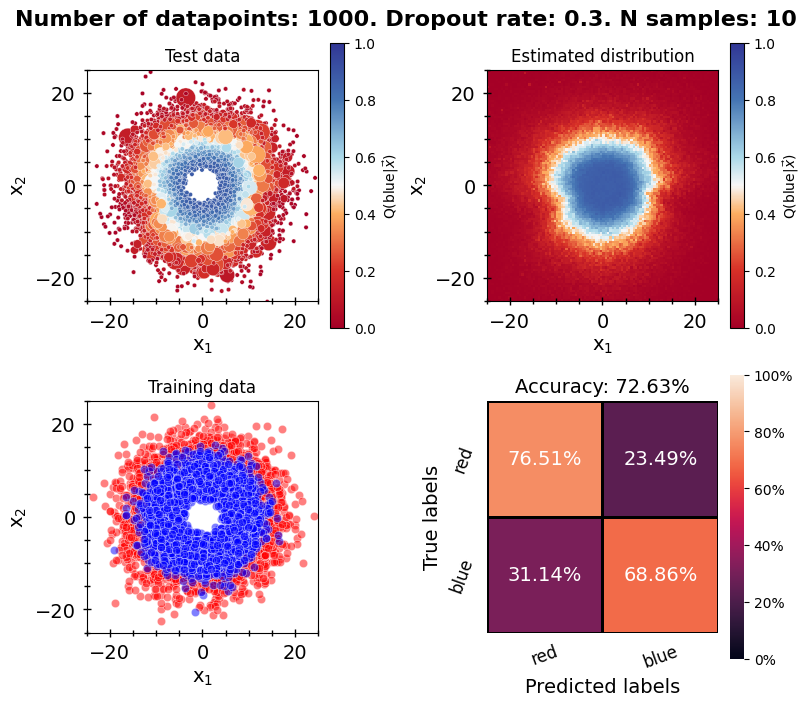

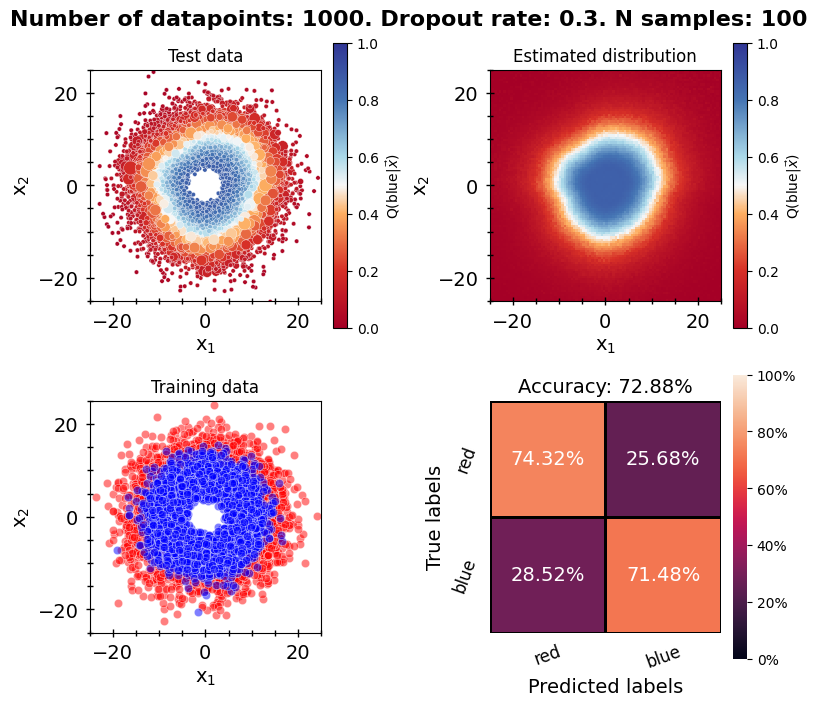

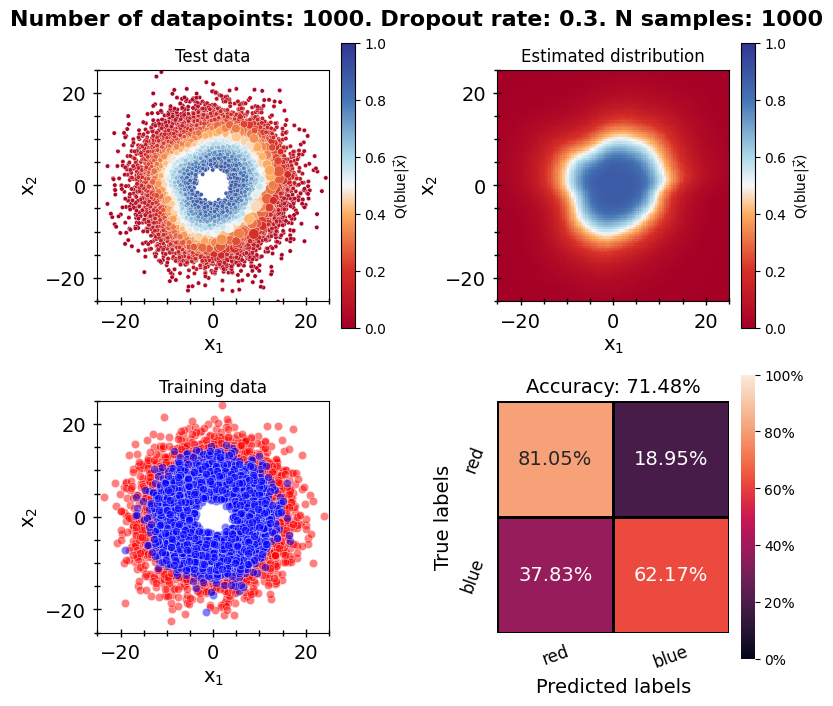

In [ ]:
# Plot
for i in range(len(n_MC_list)):
    fig, axs = plt.subplots(nrows = 2, ncols = 2, figsize = (8, 7), layout="constrained")

    axs[0][0] = plot_results(test_dfs_nMC[i], f"Confidence_MC", axs[0][0], "Test data", error_key=f"Std_MC")
    axs[0][1] = plot_grid(grid_dfs_nMC[i], f"Confidence_MC", axs[0][1], "Estimated distribution")
    axs[1][1] = plot_conf_matrix(test_dfs_nMC[i], "class", f"Prediction_MC", ["red", "blue"], axs[1][1])
    axs[1][0] = plot_data(train_data[0:5000], axs[1][0], "Training data")

    cmap = red_blue_cmap()
    hue_norm = mpl.colors.Normalize(vmin=0, vmax=1, clip=False)
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][0])
    fig.colorbar(mpl.cm.ScalarMappable(norm=hue_norm, cmap=cmap), label=r"Q(blue|$\vec{x}$)", ax=axs[0][1])

    fig.suptitle(f"Number of datapoints: {n_train}. Dropout rate: {drop_out_rate}. N samples: {n_MC_list[i]}", size=16, fontweight="bold")


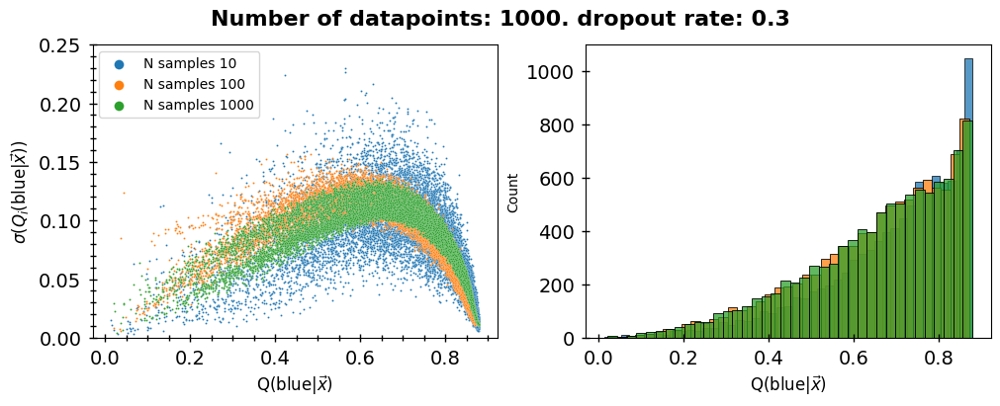

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(n_MC_list)):
    sn.scatterplot(test_dfs_nMC[i], x="Confidence", y=f"Std_MC", s=2, label=f"N samples {n_MC_list[i]}", ax = axs[0])
    axs[0].legend(markerscale=5)
    axs[0].set_ylabel(r"$\sigma$($Q_i$(blue|$\vec{x}$))", fontsize=12)
    axs[0].set_xlabel(r"Q(blue|$\vec{x}$)", fontsize=12)
    axs[0].set_ylim(0, 0.25)

    sn.histplot(test_dfs_nMC[i], x="Confidence", ax = axs[1])
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel(r"Q(blue|$\vec{x}$)", fontsize=12)

    for ax in axs:
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
    axs[0].minorticks_on()
    fig.suptitle(f"Number of datapoints: {n_train}. dropout rate: {drop_out_rate}", size=16, fontweight="bold")

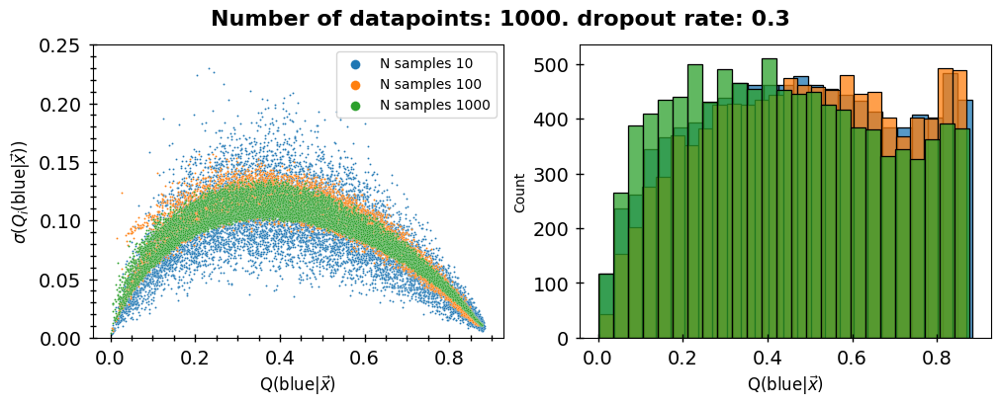

In [ ]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize= (10, 4), layout="constrained")
for i in range(len(n_MC_list)):
    sn.scatterplot(test_dfs_nMC[i], x="Confidence_MC", y=f"Std_MC", s=2, label=f"N samples {n_MC_list[i]}", ax = axs[0])
    axs[0].legend(markerscale=5)
    axs[0].set_ylabel(r"$\sigma$($Q_i$(blue|$\vec{x}$))", fontsize=12)
    axs[0].set_xlabel(r"Q(blue|$\vec{x}$)", fontsize=12)
    axs[0].set_ylim(0, 0.25)

    sn.histplot(test_dfs_nMC[i], x="Confidence_MC", ax = axs[1])
    axs[1].set_ylabel("Count")
    axs[1].set_xlabel(r"Q(blue|$\vec{x}$)", fontsize=12)

    for ax in axs:
        ax.tick_params(which="both", direction="inout", bottom=True, left=True, labelsize=14, pad=5, length=4, width=1)
        ax.tick_params(which="major", length=6)
    axs[0].minorticks_on()
    fig.suptitle(f"Number of datapoints: {n_train}. dropout rate: {drop_out_rate}", size=16, fontweight="bold")